If you haven't gone through [Carl's Tutorial](https://github.com/carlshan/intro_to_machine_learning/blob/master/lessons/Reinforcement_Learning/RL_Tutorial.md), you may want to go through that and implement the hill-climbing policy before attempting this tutorial. I would not recommend implementing the policy gradient strategy unless you're interested in learning more about lower-level tensorflow. This tutorial uses the keras, like the others this semester.

Original code taken from [https://gist.github.com/EderSantana/c7222daa328f0e885093](https://gist.github.com/EderSantana/c7222daa328f0e885093)

# Installation
To be able to run the animation below, make sure you have the latest version of matplotlib, by running `pip3 install matplotlib --upgrade`

In [3]:
%matplotlib inline
import json
import numpy as np
import random
from keras.models import Sequential
from keras.layers.core import Dense
from keras.layers.core import Flatten
from keras.layers import Conv2D
from keras.optimizers import sgd
import matplotlib.pyplot as plt
import matplotlib.animation
import IPython.display

/usr/local/Cellar/python3/3.6.4_2/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.
/usr/local/Cellar/python3/3.6.4_2/Frameworks/Python.framework/Versions/3.6/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: compiletime version 3.5 of module 'tensorflow.python.framework.fast_tensor_util' does not match runtime version 3.6
  return f(*args, **kwds)


## Define the game environment and replay classes

In [4]:
class Catch(object):
    def __init__(self, grid_size=10):
        '''
        Input: grid_size (length of the side of the canvas)
        
        Initializes internal state.
        '''
        self.grid_size = grid_size
        self.min_basket_center = 1
        self.max_basket_center = self.grid_size-2
        self.reset()

    def _update_state(self, action):
        '''
        Input: action (0 for left, 1 for stay, 2 for right)
        
        Moves basket according to action. Moves fruit down. Updates state to reflect these movements
        '''
        if action == 0:  # left
            movement = -1
        elif action == 1:  # stay
            movement = 0
        elif action == 2: # right
            movement = 1
        else:
            raise Exception('Invalid action {}'.format(action))
        fruit_x, fruit_y, basket_center = self.state
        # move the basket unless this would move it off the edge of the grid
        new_basket_center = min(max(self.min_basket_center, basket_center + movement), self.max_basket_center)
        # move fruit down
        fruit_y += 1
        out = np.asarray([fruit_x, fruit_y, new_basket_center])
        self.state = out

    def _draw_state(self):
        '''
        Returns a 2D numpy array with 1s (white squares) at the locations of the fruit and basket and
        0s (black squares) everywhere else.
        '''
        im_size = (self.grid_size, self.grid_size)
        canvas = np.zeros(im_size)
        
        fruit_x, fruit_y, basket_center = self.state
        canvas[fruit_y, fruit_x] = 1  # draw fruit
        canvas[-1, basket_center-1:basket_center + 2] = 1  # draw 3-pixel basket
        return canvas

    def _get_reward(self):
        '''
        Returns 1 if the fruit was caught, -1 if it was dropped, and 0 if it is still in the air.
        '''
        fruit_x, fruit_y, basket_center = self.state
        if fruit_y == self.grid_size-1:
            if abs(fruit_x - basket_center) <= 1:
                return 1 # it caught the fruit
            else:
                return -1 # it dropped the fruit
        else:
            return 0 # the fruit is still in the air

    def observe(self):
        '''
        Returns the current canvas, as a 1D array.
        '''
        canvas = self._draw_state()
        return canvas.reshape((1, -1))

    def act(self, action):
        '''
        Input: action (0 for left, 1 for stay, 2 for right)
        
        Returns:
            current canvas (as a 1D array)
            reward received after this action
            True if game is over and False otherwise
        '''
        self._update_state(action)
        observation = self.observe()
        reward = self._get_reward()
        game_over = (reward != 0) # if the reward is zero, the fruit is still in the air
        return observation, reward, game_over

    def reset(self):
        '''
        Updates internal state
            fruit in a random column in the top row
            basket center in a random column
        '''
        fruit_x = random.randint(0, self.grid_size-1)
        fruit_y = 0
        basket_center = random.randint(self.min_basket_center, self.max_basket_center)
        self.state = np.asarray([fruit_x, fruit_y, basket_center])


class ExperienceReplay(object):
    def __init__(self, max_memory=100, discount=.9):
        self.max_memory = max_memory
        self.memory = list()
        self.discount = discount

    def remember(self, states, game_over):
        '''
        Input:
            states: [starting_observation, action_taken, reward_received, new_observation]
            game_over: boolean
        Add the states and game over to the internal memory array. If the array is longer than
        self.max_memory, drop the oldest memory
        '''
        self.memory.append([states, game_over])
        if len(self.memory) > self.max_memory:
            del self.memory[0]

    def get_batch(self, model, batch_size=10):
        '''
        Randomly chooses batch_size memories, possibly repeating.
        For each of these memories, updates the models current best guesses about the value of taking a
            certain action from the starting state, based on the reward received and the model's current
            estimate of how valuable the new state is.
        '''
        len_memory = len(self.memory)
        num_actions = model.output_shape[-1] # the number of possible actions
        env_dim = self.memory[0][0][0].shape[1:] # the number of pixels in the image
        input_size = min(len_memory, batch_size)
        inputs = np.zeros((input_size, env_dim[0], env_dim[1], env_dim[2]))
        targets = np.zeros((input_size, num_actions))
        for i, idx in enumerate(np.random.randint(0, len_memory, size=input_size)):
            starting_observation, action_taken, reward_received, new_observation = self.memory[idx][0]
            game_over = self.memory[idx][1]

            # Set the input to the state that was observed in the game before an action was taken
            inputs[i:i+1] = starting_observation
            
            # Start with the model's current best guesses about the value of taking each action from this state
            targets[i] = model.predict(starting_observation)[0]
            
            # Now we need to update the value of the action that was taken                      
            if game_over: 
                # if the game is over, give the actual reward received
                targets[i, action_taken] = reward_received
            else:
                # if the game is not over, give the reward received (always zero in this particular game)
                # plus the maximum reward predicted for state we got to by taking this action (with a discount)
                Q_sa = np.max(model.predict(new_observation)[0])
                targets[i, action_taken] = reward_received + self.discount * Q_sa
        return inputs, targets




## Creating Snake Enviorment

In [30]:
class Snake(object):
    def __init__(self, grid_size = 45, max_moves_multiplyer = 1):
        self.max_moves = (grid_size**2) *  max_moves_multiplyer
        self.grid_size = grid_size
        snake = [[int(grid_size/2), int(grid_size/2)]]
        snake.append([snake[0][0] - 1, snake[0][1]])
        fruit_x = np.random.randint(0, grid_size)
        fruit_y = np.random.randint(0, grid_size)
#         fruit_x = snake[0][0] + 1
#         fruit_y = snake[0][1]
        move = 0
        self.state = [[fruit_x, fruit_y], snake, [move]]
    
    def _update_state(self, action):
        [fruit_x, fruit_y], snake, [move] = self.state
        
        direction = [snake[0][0] - snake[1][0], snake[0][1] - snake[1][1]]
        if action == 0:
            movement = direction # Forward
        elif action == 1:
            movement = [-1*direction[1], direction[0]] # Right
        elif action == 2:
            movement = [direction[1], -1*direction[0]] # Down
        else:
            raise Exception('Invalid action {}'.format(action))
        
        snake_new = [np.add(snake[0], movement).tolist()] + snake
        
        if [fruit_x, fruit_y] not in snake_new:
            snake_new = snake_new[:-1]
        
        #print("Snake: {}".format(snake))
        self.state = [[fruit_x, fruit_y], snake_new, [move + 1]]
        
    def _draw_state(self):
        
        im_size = (self.grid_size, self.grid_size, 3)
        canvas = np.zeros(im_size)
        
        [fruit_x, fruit_y], snake, [move] = self.state
        canvas[fruit_y, fruit_x] = [1, 0, 0]  # draw fruit
        canvas[snake[0][1]][snake[0][0]] = [0, 1, 0]
        for coord in snake[1:]:
            try:
                canvas[coord[1]][coord[0]] = [0, 0, 1]  # draw snake
            except IndexError:
                canvas = np.zeros(im_size)
                print("index error")
                break
        return canvas
        
    def _get_reward(self):
        
        [fruit_x, fruit_y], snake, [move] = self.state
        if snake[0] in snake[1:]:
            #print("ouch")
            return -1 # it hit itself
        if snake[0][0] < 0 or snake[0][0] > self.grid_size - 1 or snake[0][1] < 0 or snake[0][1] > self.grid_size - 1:
            return -1 # it hit a wall
        if [fruit_x, fruit_y] in snake:
            #print("got fruit?")
            while [fruit_x, fruit_y] in snake: # reseting fruit probably, need a better way if the snake gets good.
                fruit_x = np.random.randint(0, grid_size)
                fruit_y = np.random.randint(0, grid_size)
            self.state[0] = [fruit_x, fruit_y]
            self.state[2] = [0]
            return 1 # it ate the fruit
        if move > (self.max_moves) + (len(snake)):
            return -2 # ran out of time
#         if (fruit_x - snake[0][0])**2 + (fruit_y - snake[0][1])**2 < (fruit_x - snake[1][0])**2 + (fruit_y - snake[1][1])**2:
#             return 1
        else:
            return 0 # the fruit is still on the board
    
    def observe(self):
        
        canvas = self._draw_state()
        
        return np.array([canvas])
    
    def act(self, action):
        
        self._update_state(action)
        reward = self._get_reward()
        if reward != -1:
            observation = self.observe()
        else:
            [fruit_x, fruit_y], snake, [move] = self.state
            self.state = [[fruit_x, fruit_y], snake[1:], [move]] # removing head bc if it goes out of bounds then the observe does not work.
            observation = self.observe()
        
        game_over = (reward < 0) # if the reward is -1 then the snake died
        return observation, reward, game_over
    
    def reset(self):
        
        snake = [[int(grid_size/2), int(grid_size/2)]]
        snake.append([snake[0][0] - 1, snake[0][1]])
        fruit_x = np.random.randint(0, grid_size)
        fruit_y = np.random.randint(0, grid_size)
#         fruit_x = snake[0][0] + 1
#         fruit_y = snake[0][1]
        move = 0
        self.state = [[fruit_x, fruit_y], snake, [move]]

##  Functions for creating, training, and visualizing the model

In [59]:
# parameters
epsilon = .1  # probability of exploration (choosing a random action instead of the current best one)
num_actions = 3  # [move_left, move_forward, move_right]
max_memory = 500
hidden_size = 64
batch_size = 50
grid_size = 10
discount = .90

def build_model():
    '''
     Returns three initialized objects: the model, the environment, and the replay.
    '''
    model = Sequential()
    model.add(Conv2D(filters = hidden_size, kernel_size = 3, input_shape = (grid_size, grid_size, 3), activation='relu'))
    model.add(Conv2D(filters = hidden_size, kernel_size = 3, activation = 'relu'))
    model.add(Conv2D(filters = hidden_size, kernel_size = 3, activation = 'relu'))
    model.add(Flatten())
    model.add(Dense(num_actions))
    model.compile(sgd(lr=.2, clipnorm = 1.0), "mse")

    # Define environment/game
    env = Snake(grid_size)

    # Initialize experience replay object
    exp_replay = ExperienceReplay(max_memory=max_memory, discount = discount)
    
    return model, env, exp_replay


def train_model(model, env, exp_replay, num_episodes):
    '''
    Inputs:
        model, env, and exp_replay objects as returned by build_model
        num_episodes: integer, the number of episodes that should be rolled out for training
    '''
    totals = []
    for episode in range(num_episodes):
        loss = 0.
        env.reset()
        game_over = False
        # get initial input
        starting_observation = env.observe()
        
        catch_count = 0

        while not game_over:
            # get next action
            if np.random.rand() <= epsilon:
                # epsilon of the time, we just choose randomly
                action = np.random.randint(0, num_actions, size=1)
            else:
                # find which action the model currently thinks is best from this state
                q = model.predict(starting_observation)
                action = np.argmax(q[0])

            # apply action, get rewards and new state
            new_observation, reward, game_over = env.act(action)
            if reward == 1:
                catch_count += 1

            # store experience
            exp_replay.remember([starting_observation, action, reward, new_observation], game_over)

            # get data updated based on the stored experiences
            inputs, targets = exp_replay.get_batch(model, batch_size=batch_size)

            # train model on the updated data
            loss += model.train_on_batch(inputs, targets)

            starting_observation = new_observation # for next time through the loop
        
        totals.append(catch_count)
        totals = totals[max(len(totals)-10, 0):]
        avg = round(sum(totals)/len(totals), 2)

        # Print update from this episode
        print("Episode {:04d}/{:04d} | Loss {:.4f} | Catch count {} | Average {}".format(episode, num_episodes-1, loss, catch_count, avg))


def create_animation(model, env, num_games):
    '''
    Inputs:
        model and env objects as returned from build_model
        num_games: integer, the number of games to be included in the animation
        
    Returns: a matplotlib animation object
    '''
    # Animation code from 
    # https://matplotlib.org/examples/animation/dynamic_image.html
    # https://stackoverflow.com/questions/35532498/animation-in-ipython-notebook/46878531#46878531
    
    # First, play the games and collect all of the images for each observed state
    
    observations = []
    for _ in range(num_games):
        print("game start")
        env.reset()
        observation = env.observe()
        observations.append(observation)
        game_over = False
        while game_over == False:
            q = model.predict(observation)
            action = np.argmax(q[0])
#             action = np.random.randint(0,4)
#             action = 1
            # apply action, get rewards and new state
            observation, reward, game_over = env.act(action)
            observations.append(observation)
            #print("move")
            print(reward)
        print("game end")
            
    fig = plt.figure()
    image = plt.imshow(np.zeros((grid_size, grid_size)),interpolation='none', animated=True, vmin=0, vmax=1)
    
    def animate(observation):
        image.set_array(observation.reshape((grid_size, grid_size,3)))
        return [image]
   
    animation = matplotlib.animation.FuncAnimation(fig, animate, frames=observations, blit=True, )
    return animation

## Let's create our model and game environment and see how it does before training

In [60]:
model, env, exp_replay = build_model()

game start
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
-2
game end
game start
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
-2
game end
game start
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
-2
game end
game start
0
0
0
0
0
-1
game end
game start
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
-2
game end
game start
0
0
0
0
0
0
0
0
-1
game end
game start
0
0
0
0
0

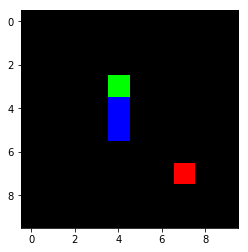

In [61]:
animation = create_animation(model, env, num_games=10)
IPython.display.HTML(animation.to_jshtml())

## Now train the model and see how much better it is at catching the fruit

Episode 0000/1999 | Loss 7701458.0767 | Catch count 1 | Average 1.0
Episode 0001/1999 | Loss 3348494.7112 | Catch count 0 | Average 0.5
Episode 0002/1999 | Loss 95981.4351 | Catch count 0 | Average 0.33
Episode 0003/1999 | Loss 1521473.2142 | Catch count 0 | Average 0.25
Episode 0004/1999 | Loss 564698.0171 | Catch count 0 | Average 0.2
Episode 0005/1999 | Loss 401522.1537 | Catch count 1 | Average 0.33
Episode 0006/1999 | Loss 4634615.3821 | Catch count 1 | Average 0.43
Episode 0007/1999 | Loss 3021048.6843 | Catch count 0 | Average 0.38
Episode 0008/1999 | Loss 2172748.6375 | Catch count 0 | Average 0.33
Episode 0009/1999 | Loss 1993500.2197 | Catch count 1 | Average 0.4
Episode 0010/1999 | Loss 3085445.6626 | Catch count 0 | Average 0.3
Episode 0011/1999 | Loss 699873.9038 | Catch count 0 | Average 0.3
Episode 0012/1999 | Loss 6461314.9185 | Catch count 0 | Average 0.3
Episode 0013/1999 | Loss 9726638.3384 | Catch count 2 | Average 0.5
Episode 0014/1999 | Loss 13234548.1768 | Catch 

Episode 0121/1999 | Loss 4203576.3054 | Catch count 0 | Average 0.6
Episode 0122/1999 | Loss 6658812.1074 | Catch count 0 | Average 0.6
Episode 0123/1999 | Loss 1554963.2095 | Catch count 0 | Average 0.6
Episode 0124/1999 | Loss 7996215.2065 | Catch count 1 | Average 0.4
Episode 0125/1999 | Loss 4667766.4512 | Catch count 0 | Average 0.1
Episode 0126/1999 | Loss 5001260.2910 | Catch count 1 | Average 0.2
Episode 0127/1999 | Loss 7330869.2634 | Catch count 0 | Average 0.2
Episode 0128/1999 | Loss 6881096.7705 | Catch count 0 | Average 0.2
Episode 0129/1999 | Loss 8129509.0137 | Catch count 1 | Average 0.3
Episode 0130/1999 | Loss 2672632.9741 | Catch count 0 | Average 0.3
Episode 0131/1999 | Loss 9444284.7747 | Catch count 0 | Average 0.3
Episode 0132/1999 | Loss 9737921.8877 | Catch count 0 | Average 0.3
Episode 0133/1999 | Loss 9066479.5076 | Catch count 1 | Average 0.4
Episode 0134/1999 | Loss 3469753.7495 | Catch count 0 | Average 0.3
Episode 0135/1999 | Loss 12364860.9407 | Catch c

Episode 0242/1999 | Loss 1245229.4325 | Catch count 0 | Average 0.2
Episode 0243/1999 | Loss 907100.8019 | Catch count 2 | Average 0.4
Episode 0244/1999 | Loss 1300857.7820 | Catch count 1 | Average 0.5
Episode 0245/1999 | Loss 4579914.5510 | Catch count 2 | Average 0.7
Episode 0246/1999 | Loss 7969563.7808 | Catch count 1 | Average 0.8
Episode 0247/1999 | Loss 4295998.8555 | Catch count 3 | Average 1.1
Episode 0248/1999 | Loss 5082932.7637 | Catch count 0 | Average 1.1
Episode 0249/1999 | Loss 4379546.8994 | Catch count 0 | Average 1.0
Episode 0250/1999 | Loss 5973952.8633 | Catch count 0 | Average 1.0
Episode 0251/1999 | Loss 1589240.2905 | Catch count 1 | Average 1.0
Episode 0252/1999 | Loss 2517410.0420 | Catch count 0 | Average 1.0
Episode 0253/1999 | Loss 4253910.7588 | Catch count 1 | Average 0.9
Episode 0254/1999 | Loss 6425601.6494 | Catch count 0 | Average 0.8
Episode 0255/1999 | Loss 737608.3721 | Catch count 0 | Average 0.6
Episode 0256/1999 | Loss 4177388.8005 | Catch coun

Episode 0363/1999 | Loss 18985697.1772 | Catch count 1 | Average 0.7
Episode 0364/1999 | Loss 9643432.3901 | Catch count 2 | Average 0.7
Episode 0365/1999 | Loss 3524331.8696 | Catch count 0 | Average 0.7
Episode 0366/1999 | Loss 2273471.6411 | Catch count 1 | Average 0.7
Episode 0367/1999 | Loss 2517587.3320 | Catch count 0 | Average 0.5
Episode 0368/1999 | Loss 4263325.5219 | Catch count 1 | Average 0.6
Episode 0369/1999 | Loss 4074157.4943 | Catch count 1 | Average 0.6
Episode 0370/1999 | Loss 963800.6877 | Catch count 0 | Average 0.6
Episode 0371/1999 | Loss 1827799.9333 | Catch count 0 | Average 0.6
Episode 0372/1999 | Loss 390546.7852 | Catch count 0 | Average 0.6
Episode 0373/1999 | Loss 2223791.2251 | Catch count 1 | Average 0.6
Episode 0374/1999 | Loss 1733878.5763 | Catch count 3 | Average 0.7
Episode 0375/1999 | Loss 525196.3125 | Catch count 0 | Average 0.7
Episode 0376/1999 | Loss 1009474.7297 | Catch count 0 | Average 0.6
Episode 0377/1999 | Loss 1677894.4664 | Catch coun

Episode 0485/1999 | Loss 3259174.5085 | Catch count 0 | Average 0.4
Episode 0486/1999 | Loss 5760145.6121 | Catch count 2 | Average 0.5
Episode 0487/1999 | Loss 2760041.6858 | Catch count 0 | Average 0.5
Episode 0488/1999 | Loss 1585305.4039 | Catch count 0 | Average 0.3
Episode 0489/1999 | Loss 2542358.6362 | Catch count 2 | Average 0.4
Episode 0490/1999 | Loss 1266951.1433 | Catch count 0 | Average 0.4
Episode 0491/1999 | Loss 320625.5285 | Catch count 0 | Average 0.4
Episode 0492/1999 | Loss 1181534.3018 | Catch count 0 | Average 0.4
Episode 0493/1999 | Loss 298020.4797 | Catch count 0 | Average 0.4
Episode 0494/1999 | Loss 601154.8201 | Catch count 1 | Average 0.5
Episode 0495/1999 | Loss 492461.9213 | Catch count 0 | Average 0.5
Episode 0496/1999 | Loss 596119.6597 | Catch count 0 | Average 0.3
Episode 0497/1999 | Loss 2369058.0948 | Catch count 2 | Average 0.5
Episode 0498/1999 | Loss 2065979.5443 | Catch count 1 | Average 0.6
Episode 0499/1999 | Loss 1420835.9532 | Catch count 1

Episode 0607/1999 | Loss 102874.3094 | Catch count 0 | Average 0.8
Episode 0608/1999 | Loss 300416.7365 | Catch count 0 | Average 0.6
Episode 0609/1999 | Loss 592255.5106 | Catch count 0 | Average 0.5
Episode 0610/1999 | Loss 229688.6441 | Catch count 0 | Average 0.5
Episode 0611/1999 | Loss 510981.3453 | Catch count 3 | Average 0.5
Episode 0612/1999 | Loss 282850.7315 | Catch count 3 | Average 0.8
Episode 0613/1999 | Loss 119872.4380 | Catch count 0 | Average 0.7
Episode 0614/1999 | Loss 218720.3851 | Catch count 1 | Average 0.7
Episode 0615/1999 | Loss 71547.0893 | Catch count 0 | Average 0.7
Episode 0616/1999 | Loss 208499.6202 | Catch count 3 | Average 1.0
Episode 0617/1999 | Loss 30485.1654 | Catch count 0 | Average 1.0
Episode 0618/1999 | Loss 108836.7038 | Catch count 1 | Average 1.1
Episode 0619/1999 | Loss 143030.6217 | Catch count 1 | Average 1.2
Episode 0620/1999 | Loss 7945.9144 | Catch count 0 | Average 1.2
Episode 0621/1999 | Loss 149913.0072 | Catch count 1 | Average 1.0

Episode 0730/1999 | Loss 210959.3643 | Catch count 0 | Average 0.7
Episode 0731/1999 | Loss 188232.1593 | Catch count 1 | Average 0.8
Episode 0732/1999 | Loss 58117.1130 | Catch count 0 | Average 0.7
Episode 0733/1999 | Loss 235966.3781 | Catch count 0 | Average 0.6
Episode 0734/1999 | Loss 160393.4553 | Catch count 0 | Average 0.5
Episode 0735/1999 | Loss 82951.8349 | Catch count 0 | Average 0.4
Episode 0736/1999 | Loss 143956.6462 | Catch count 1 | Average 0.5
Episode 0737/1999 | Loss 28398.8901 | Catch count 0 | Average 0.2
Episode 0738/1999 | Loss 114734.1979 | Catch count 0 | Average 0.2
Episode 0739/1999 | Loss 249474.7433 | Catch count 0 | Average 0.2
Episode 0740/1999 | Loss 339128.3232 | Catch count 2 | Average 0.4
Episode 0741/1999 | Loss 382330.9553 | Catch count 0 | Average 0.3
Episode 0742/1999 | Loss 473996.7537 | Catch count 0 | Average 0.3
Episode 0743/1999 | Loss 1346402.5327 | Catch count 3 | Average 0.6
Episode 0744/1999 | Loss 1026451.2597 | Catch count 0 | Average 

Episode 0853/1999 | Loss 109461.9970 | Catch count 0 | Average 0.6
Episode 0854/1999 | Loss 166956.2878 | Catch count 0 | Average 0.6
Episode 0855/1999 | Loss 355623.7272 | Catch count 2 | Average 0.8
Episode 0856/1999 | Loss 8591.5681 | Catch count 0 | Average 0.4
Episode 0857/1999 | Loss 336943.4915 | Catch count 2 | Average 0.6
Episode 0858/1999 | Loss 180366.7196 | Catch count 1 | Average 0.7
Episode 0859/1999 | Loss 158576.1353 | Catch count 0 | Average 0.7
Episode 0860/1999 | Loss 3980.1350 | Catch count 0 | Average 0.6
Episode 0861/1999 | Loss 117718.1929 | Catch count 0 | Average 0.6
Episode 0862/1999 | Loss 229443.8683 | Catch count 0 | Average 0.5
Episode 0863/1999 | Loss 52101.5383 | Catch count 0 | Average 0.5
Episode 0864/1999 | Loss 381011.5021 | Catch count 0 | Average 0.5
Episode 0865/1999 | Loss 495741.3465 | Catch count 1 | Average 0.4
Episode 0866/1999 | Loss 184845.8847 | Catch count 1 | Average 0.5
Episode 0867/1999 | Loss 21169.9153 | Catch count 0 | Average 0.3
E

Episode 0976/1999 | Loss 163176.9439 | Catch count 1 | Average 1.4
Episode 0977/1999 | Loss 57047.1329 | Catch count 1 | Average 1.4
Episode 0978/1999 | Loss 119156.3828 | Catch count 0 | Average 1.3
Episode 0979/1999 | Loss 96013.8186 | Catch count 0 | Average 1.3
Episode 0980/1999 | Loss 155764.2264 | Catch count 1 | Average 1.1
Episode 0981/1999 | Loss 381665.4093 | Catch count 1 | Average 1.2
Episode 0982/1999 | Loss 82488.3660 | Catch count 0 | Average 1.2
Episode 0983/1999 | Loss 735318.5746 | Catch count 0 | Average 0.8
Episode 0984/1999 | Loss 738917.0981 | Catch count 0 | Average 0.5
Episode 0985/1999 | Loss 252446.4814 | Catch count 2 | Average 0.6
Episode 0986/1999 | Loss 631898.3857 | Catch count 1 | Average 0.6
Episode 0987/1999 | Loss 382331.8314 | Catch count 0 | Average 0.5
Episode 0988/1999 | Loss 304280.4537 | Catch count 0 | Average 0.5
Episode 0989/1999 | Loss 333000.9735 | Catch count 0 | Average 0.5
Episode 0990/1999 | Loss 153247.2642 | Catch count 0 | Average 0.

Episode 1099/1999 | Loss 574877.5535 | Catch count 0 | Average 0.2
Episode 1100/1999 | Loss 157250.1816 | Catch count 2 | Average 0.4
Episode 1101/1999 | Loss 73847.6407 | Catch count 0 | Average 0.4
Episode 1102/1999 | Loss 173735.7444 | Catch count 0 | Average 0.4
Episode 1103/1999 | Loss 418028.7718 | Catch count 0 | Average 0.4
Episode 1104/1999 | Loss 463975.2417 | Catch count 2 | Average 0.5
Episode 1105/1999 | Loss 344390.3905 | Catch count 0 | Average 0.5
Episode 1106/1999 | Loss 301767.3416 | Catch count 0 | Average 0.4
Episode 1107/1999 | Loss 573746.9178 | Catch count 0 | Average 0.4
Episode 1108/1999 | Loss 542272.5137 | Catch count 0 | Average 0.4
Episode 1109/1999 | Loss 1071023.1633 | Catch count 0 | Average 0.4
Episode 1110/1999 | Loss 668371.0410 | Catch count 0 | Average 0.2
Episode 1111/1999 | Loss 672182.3106 | Catch count 0 | Average 0.2
Episode 1112/1999 | Loss 478686.1657 | Catch count 1 | Average 0.3
Episode 1113/1999 | Loss 552127.9641 | Catch count 0 | Average

Episode 1222/1999 | Loss 289542.3477 | Catch count 1 | Average 0.5
Episode 1223/1999 | Loss 108185.3512 | Catch count 0 | Average 0.5
Episode 1224/1999 | Loss 26633.6492 | Catch count 0 | Average 0.5
Episode 1225/1999 | Loss 125716.9972 | Catch count 0 | Average 0.5
Episode 1226/1999 | Loss 125322.1182 | Catch count 0 | Average 0.4
Episode 1227/1999 | Loss 49767.6901 | Catch count 1 | Average 0.4
Episode 1228/1999 | Loss 24616.3566 | Catch count 0 | Average 0.4
Episode 1229/1999 | Loss 36264.7441 | Catch count 1 | Average 0.4
Episode 1230/1999 | Loss 26793.1344 | Catch count 1 | Average 0.5
Episode 1231/1999 | Loss 22414.8742 | Catch count 0 | Average 0.4
Episode 1232/1999 | Loss 40159.7653 | Catch count 0 | Average 0.3
Episode 1233/1999 | Loss 81708.1841 | Catch count 0 | Average 0.3
Episode 1234/1999 | Loss 319388.8659 | Catch count 0 | Average 0.3
Episode 1235/1999 | Loss 354157.7015 | Catch count 0 | Average 0.3
Episode 1236/1999 | Loss 509670.5004 | Catch count 0 | Average 0.3
Epi

Episode 1346/1999 | Loss 89568.6212 | Catch count 1 | Average 1.0
Episode 1347/1999 | Loss 28876.9022 | Catch count 0 | Average 0.9
Episode 1348/1999 | Loss 63958.3113 | Catch count 2 | Average 1.1
Episode 1349/1999 | Loss 201077.7147 | Catch count 0 | Average 0.9
Episode 1350/1999 | Loss 104155.1105 | Catch count 0 | Average 0.9
Episode 1351/1999 | Loss 216195.5809 | Catch count 1 | Average 0.8
Episode 1352/1999 | Loss 581247.9132 | Catch count 0 | Average 0.7
Episode 1353/1999 | Loss 515962.7446 | Catch count 0 | Average 0.5
Episode 1354/1999 | Loss 1894334.3460 | Catch count 0 | Average 0.4
Episode 1355/1999 | Loss 2133699.9697 | Catch count 1 | Average 0.5
Episode 1356/1999 | Loss 1599406.4071 | Catch count 0 | Average 0.4
Episode 1357/1999 | Loss 323141.9106 | Catch count 0 | Average 0.4
Episode 1358/1999 | Loss 333565.2714 | Catch count 0 | Average 0.2
Episode 1359/1999 | Loss 512011.0091 | Catch count 0 | Average 0.2
Episode 1360/1999 | Loss 641847.8837 | Catch count 1 | Average

Episode 1469/1999 | Loss 127268.3163 | Catch count 0 | Average 0.5
Episode 1470/1999 | Loss 175682.5377 | Catch count 1 | Average 0.4
Episode 1471/1999 | Loss 219752.0055 | Catch count 1 | Average 0.5
Episode 1472/1999 | Loss 232606.6730 | Catch count 0 | Average 0.4
Episode 1473/1999 | Loss 550866.6785 | Catch count 1 | Average 0.4
Episode 1474/1999 | Loss 1393459.3611 | Catch count 2 | Average 0.6
Episode 1475/1999 | Loss 429505.6228 | Catch count 1 | Average 0.7
Episode 1476/1999 | Loss 542802.3840 | Catch count 1 | Average 0.8
Episode 1477/1999 | Loss 158677.9675 | Catch count 0 | Average 0.7
Episode 1478/1999 | Loss 26830.5310 | Catch count 0 | Average 0.7
Episode 1479/1999 | Loss 190997.6276 | Catch count 3 | Average 1.0
Episode 1480/1999 | Loss 76906.4721 | Catch count 1 | Average 1.0
Episode 1481/1999 | Loss 134182.0826 | Catch count 1 | Average 1.0
Episode 1482/1999 | Loss 39096.2884 | Catch count 0 | Average 1.0
Episode 1483/1999 | Loss 41132.0960 | Catch count 1 | Average 1.

Episode 1593/1999 | Loss 15551.0307 | Catch count 0 | Average 0.9
Episode 1594/1999 | Loss 33475.7918 | Catch count 0 | Average 0.8
Episode 1595/1999 | Loss 42305.1136 | Catch count 1 | Average 0.7
Episode 1596/1999 | Loss 209204.2662 | Catch count 1 | Average 0.6
Episode 1597/1999 | Loss 880020.6574 | Catch count 0 | Average 0.6
Episode 1598/1999 | Loss 2249257.0448 | Catch count 0 | Average 0.6
Episode 1599/1999 | Loss 482841.7736 | Catch count 0 | Average 0.5
Episode 1600/1999 | Loss 624411.1288 | Catch count 0 | Average 0.3
Episode 1601/1999 | Loss 2855367.9177 | Catch count 2 | Average 0.4
Episode 1602/1999 | Loss 1207944.3286 | Catch count 1 | Average 0.5
Episode 1603/1999 | Loss 399840.3888 | Catch count 3 | Average 0.8
Episode 1604/1999 | Loss 396463.0324 | Catch count 3 | Average 1.1
Episode 1605/1999 | Loss 365930.8203 | Catch count 0 | Average 1.0
Episode 1606/1999 | Loss 573802.3324 | Catch count 0 | Average 0.9
Episode 1607/1999 | Loss 624805.0624 | Catch count 0 | Average

Episode 1717/1999 | Loss 84889.1261 | Catch count 0 | Average 0.1
Episode 1718/1999 | Loss 148987.5464 | Catch count 1 | Average 0.2
Episode 1719/1999 | Loss 217898.1380 | Catch count 1 | Average 0.3
Episode 1720/1999 | Loss 164506.6696 | Catch count 1 | Average 0.4
Episode 1721/1999 | Loss 116460.7997 | Catch count 0 | Average 0.4
Episode 1722/1999 | Loss 80780.5217 | Catch count 0 | Average 0.4
Episode 1723/1999 | Loss 90811.6495 | Catch count 1 | Average 0.5
Episode 1724/1999 | Loss 64388.7437 | Catch count 0 | Average 0.4
Episode 1725/1999 | Loss 72910.0416 | Catch count 2 | Average 0.6
Episode 1726/1999 | Loss 229643.9484 | Catch count 1 | Average 0.7
Episode 1727/1999 | Loss 272783.4120 | Catch count 0 | Average 0.7
Episode 1728/1999 | Loss 325934.4153 | Catch count 0 | Average 0.6
Episode 1729/1999 | Loss 352330.6836 | Catch count 1 | Average 0.6
Episode 1730/1999 | Loss 335137.4530 | Catch count 2 | Average 0.7
Episode 1731/1999 | Loss 332931.2843 | Catch count 1 | Average 0.8


Episode 1841/1999 | Loss 91203.7404 | Catch count 0 | Average 0.3
Episode 1842/1999 | Loss 134097.2867 | Catch count 3 | Average 0.5
Episode 1843/1999 | Loss 35251.8419 | Catch count 0 | Average 0.5
Episode 1844/1999 | Loss 98451.0745 | Catch count 1 | Average 0.5
Episode 1845/1999 | Loss 49724.9778 | Catch count 0 | Average 0.5
Episode 1846/1999 | Loss 36613.1009 | Catch count 2 | Average 0.6
Episode 1847/1999 | Loss 69889.2354 | Catch count 0 | Average 0.6
Episode 1848/1999 | Loss 84108.9280 | Catch count 0 | Average 0.6
Episode 1849/1999 | Loss 79029.0884 | Catch count 1 | Average 0.7
Episode 1850/1999 | Loss 56735.1299 | Catch count 0 | Average 0.7
Episode 1851/1999 | Loss 37742.2506 | Catch count 0 | Average 0.7
Episode 1852/1999 | Loss 34501.8579 | Catch count 1 | Average 0.5
Episode 1853/1999 | Loss 37555.4328 | Catch count 1 | Average 0.6
Episode 1854/1999 | Loss 79302.1618 | Catch count 2 | Average 0.7
Episode 1855/1999 | Loss 205079.7951 | Catch count 0 | Average 0.7
Episode 

Episode 1965/1999 | Loss 32070.7029 | Catch count 0 | Average 0.7
Episode 1966/1999 | Loss 60710.5935 | Catch count 0 | Average 0.7
Episode 1967/1999 | Loss 38322.5070 | Catch count 0 | Average 0.6
Episode 1968/1999 | Loss 8448.4926 | Catch count 1 | Average 0.7
Episode 1969/1999 | Loss 8225.8772 | Catch count 1 | Average 0.8
Episode 1970/1999 | Loss 16814.7429 | Catch count 3 | Average 0.9
Episode 1971/1999 | Loss 1345.7836 | Catch count 1 | Average 1.0
Episode 1972/1999 | Loss 8463.8771 | Catch count 0 | Average 0.9
Episode 1973/1999 | Loss 5914.1448 | Catch count 0 | Average 0.7
Episode 1974/1999 | Loss 11758.5063 | Catch count 2 | Average 0.8
Episode 1975/1999 | Loss 8831.7072 | Catch count 0 | Average 0.8
Episode 1976/1999 | Loss 10952.5878 | Catch count 0 | Average 0.8
Episode 1977/1999 | Loss 91015.9384 | Catch count 1 | Average 0.9
Episode 1978/1999 | Loss 73635.5118 | Catch count 1 | Average 0.9
Episode 1979/1999 | Loss 28878.0161 | Catch count 0 | Average 0.8
Episode 1980/199

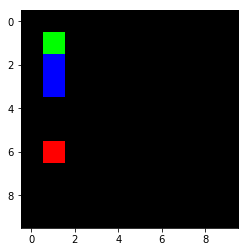

In [63]:
train_model(model, env, exp_replay, num_episodes=2000)
animation = create_animation(model, env, num_games=10)
IPython.display.HTML(animation.to_jshtml())

# Possible Exercises:
1. Add a validation function, to make it easier to assess models.
1. We've been looking at convolutional neural networks for image processing. Try changing the model to use convolutional layers. Does this seem to work any better?
1. Change the code so that the basket is trying to avoid getting hit by the fruit.
1. Change the code so the game keeps going until the basket misses the fruit. (To test that this is working, you may want to change the number of games in the animation to 1.) How should this change the rewards that the model gets?
1. Change the game to something entirely different.
1. Try changing how the training works, using more of a policy gradient strategy.

In [4]:
a = [1,2,3]
a[1:]

[2, 3]

In [50]:
np.expand_dims([[1,2],[3,4]], axis = 2)

array([[[1],
        [2]],

       [[3],
        [4]]])